In [130]:
# import those beauties

import pandas as pd
import geopandas as gpd
import geopy
from geopandas.tools import geocode
import contextily as ctx
from geopy.geocoders import Nominatim
import shapely
import matplotlib.pyplot as plt
import numpy as np
import math
import seaborn as sns
from geopandas import GeoDataFrame
from shapely.geometry import Polygon, Point
import pylab as pl
from shapely import wkt

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)

In [2]:
# read zri data for mapping by zri
zri_raw = pd.read_csv('/Users/trevorban/Desktop/zri-data/Zip_ZORI_AllHomesPlusMultifamily_SSA.csv')
zri = zri_raw.copy()

In [3]:
# read my file of target zipcodes
city_zip = pd.read_csv('/Users/trevorban/Desktop/zri-data/complete/city_zip.csv').drop(columns='Unnamed: 0')
city_zip.head()

,metro,zip
0,austin,78727
1,austin,78759
2,austin,78681
3,austin,78728
4,austin,78634


In [7]:
# giant texas roads shapefile.  Will later on select only relevant coordinates to fill each city with roads.
highway_sf = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/texas_highway/texas_highway.shp')

<AxesSubplot:>

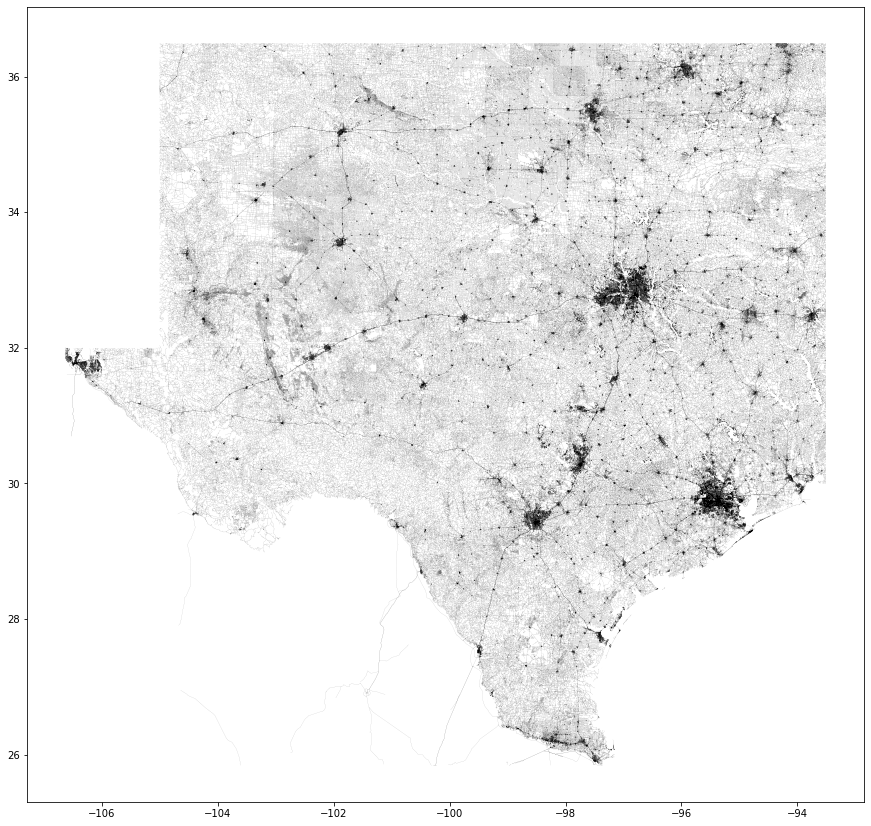

In [8]:
# beautiful
fig,ax = plt.subplots(figsize=(15,15))
highway_sf.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.05)

In [9]:
# not many usable features.  I'll have to just pull coordinates from geometry in order to select which to use.  
highway_sf.head()

,TYPE,NAME,ONEWAY,geometry
0,secondary,McNutt Rd,None,"LINESTRING (-106.54289 31.80148, -106.54433 31..."
1,residential,None,None,"LINESTRING (-106.63227 31.98552, -106.63193 31..."
2,residential,Man O War St,None,"LINESTRING (-106.63225 31.90800, -106.63129 31..."
3,residential,Country Club Rd,None,"LINESTRING (-106.63216 31.84619, -106.62635 31..."
4,residential,Crawford Rd,None,"LINESTRING (-106.62104 31.84665, -106.62128 31..."


In [10]:
# load the roads for each metro
sanan = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/sanan/shape/roads.shp')
dfw = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw/shape/roads.shp')
houston = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston/shape/roads.shp')
austin = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/roads.shp')
elpaso = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/elpaso/shape/roads.shp')


In [11]:
sanan_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/sanan/shape/waterways.shp')
dfw_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw/shape/waterways.shp')
houston_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston/shape/waterways.shp')
austin_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/waterways.shp')
elpaso_water = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/elpaso/shape/waterways.shp')


In [12]:
sanan_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/sanan/shape/natural.shp')
dfw_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw/shape/natural.shp')
houston_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston/shape/natural.shp')
austin_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/natural.shp')
elpaso_nat = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/elpaso/shape/natural.shp')


In [13]:
sanan_nat_water = sanan_nat[sanan_nat['type']=='water']
dfw_nat_water = dfw_nat[dfw_nat['type']=='water']
houston_nat_water = houston_nat[houston_nat['type']=='water']
austin_nat_water = austin_nat[austin_nat['type']=='water']
elpaso_nat_water = elpaso_nat[elpaso_nat['type']=='water']

In [131]:
# https://gis.dallascityhall.com/shapezip.htm
# dallas
# dfw = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/dfw3/STREETS.shp')

In [132]:
# fig,ax = plt.subplots(figsize=(13,13))
# dfw.plot(ax=ax, zorder=2, legend=False, column='POSTAL_L', linewidth=.4, cmap='hsv')
# ax.grid(False)

In [133]:
# fig,ax = plt.subplots(figsize=(15,15))
# dfw.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=.4)

In [141]:
# test = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/untitled folder/Abstract/Abstract.shp')
# fig,ax = plt.subplots(figsize=(15,15))
# test.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=.4)

In [142]:
# https://regional-open-data-capcog.opendata.arcgis.com/
# test = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/houston_test/zipcode/ZIPCODE.shp')

In [143]:
# len(test.ZIPCODE.unique())

In [144]:
# fig,ax = plt.subplots(figsize=(15,15))
# test.plot(ax=ax, zorder=2, legend=True, linewidth=.4, column='ZIPCODE')

In [21]:
#houst = city_zip[city_zip['metro']=='houston']['zip']

In [145]:
# houst = test[test['PO_NAME'] == 'Houston']
# len(houst['ZIPCODE'].unique())

In [146]:
# houst['ZIPCODE'] = houst['ZIPCODE'].astype(str)

In [147]:
# houst

In [148]:
# fig,ax = plt.subplots(figsize=(15,15))
# houst.plot(ax=ax, zorder=2, legend=True, linewidth=.4, column='ZIPCODE')

# Get all zip code shapefiles

In [149]:
# import US zip codes
# https://data.houstontx.gov/dataset/zip-codes-in-the-region/resource/bb634e26-cb64-44e4-8b86-3a37d113886b

zips = gpd.read_file('/Users/trevorban/Downloads/tl_2019_us_zcta510/tl_2019_us_zcta510.shp')

In [152]:
zips

,ZCTA5CE10,GEOID10,CLASSFP10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry
0,43451,43451,B5,G6350,S,63484186,157689,+41.3183010,-083.6174935,"POLYGON ((-83.70873 41.32733, -83.70815 41.327..."
1,43452,43452,B5,G6350,S,121522304,13721730,+41.5157923,-082.9809454,"POLYGON ((-83.08698 41.53780, -83.08256 41.537..."
2,43456,43456,B5,G6350,S,9320975,1003775,+41.6318300,-082.8393923,"MULTIPOLYGON (((-82.83558 41.71082, -82.83515 ..."
3,43457,43457,B5,G6350,S,48004681,0,+41.2673301,-083.4274872,"POLYGON ((-83.49650 41.25371, -83.48382 41.253..."
4,43458,43458,B5,G6350,S,2573816,39915,+41.5304461,-083.2133648,"POLYGON ((-83.22229 41.53102, -83.22228 41.532..."
...,...,...,...,...,...,...,...,...,...,...
33139,84044,84044,B5,G6350,S,123283611,69912363,+40.7201095,-112.1549645,"POLYGON ((-112.26022 40.76909, -112.25333 40.7..."
33140,84045,84045,B5,G6350,S,52780589,105248,+40.3364908,-111.9111905,"MULTIPOLYGON (((-111.92421 40.17034, -111.9240..."
33141,84046,84046,B5,G6350,S,333205012,4460752,+40.9207693,-109.8310453,"POLYGON ((-110.00072 40.99745, -110.00036 40.9..."
33142,84047,84047,B5,G6350,S,16172461,0,+40.6152301,-111.8907499,"POLYGON ((-111.92141 40.62772, -111.92134 40.6..."


Text(0.5, 1.0, 'The US of A')

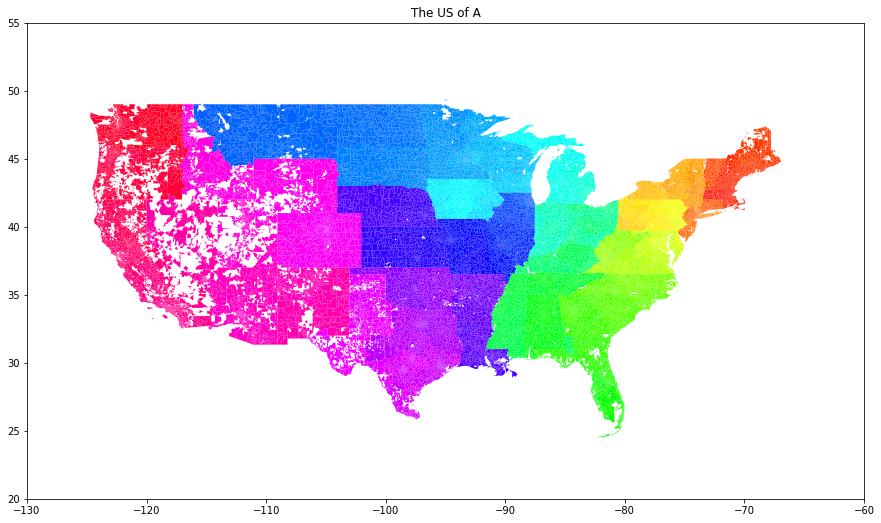

In [157]:
fig,ax = plt.subplots(figsize=(15,15))
zips.plot(ax=ax, zorder=2, cmap='hsv', column='GEOID10', legend=False)
plt.ylim(20, 55)
plt.xlim(-130, -60)
plt.title("The US of A")

In [163]:
# Other file I found...
# https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.2017.html
census_zip = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/cb_2017_us_zcta510_500k/cb_2017_us_zcta510_500k.shp')

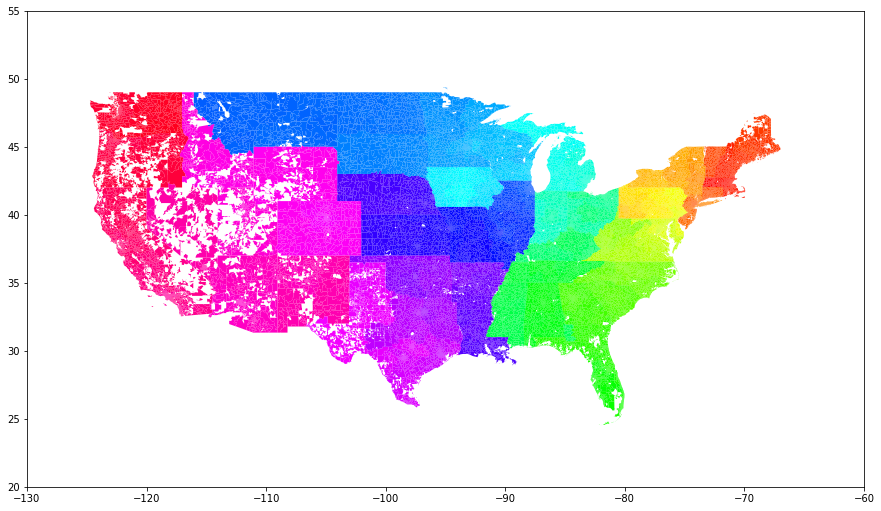

In [165]:
fig,ax = plt.subplots(figsize=(15,15))
census_zip.plot(ax=ax, zorder=2, legend=False, column = 'GEOID10', cmap='hsv')
plt.ylim(20, 55)
plt.xlim(-130, -60)
ax.grid(False)

# I guess they're the same dataset from two different sources

In [166]:
# https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.2017.html
# by county rather than zip
county_shp = gpd.read_file('/Users/trevorban/Downloads/cb_2017_48_cousub_500k/cb_2017_48_cousub_500k.shp')

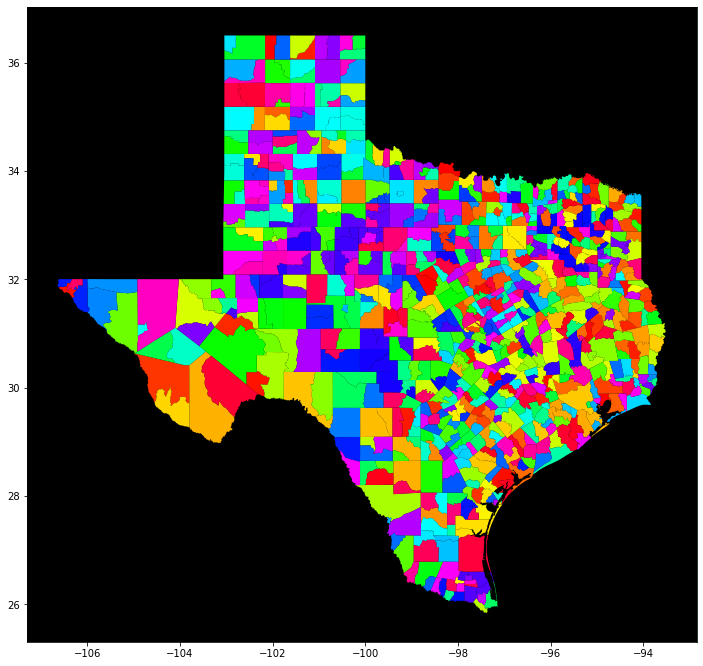

In [170]:
fig,ax = plt.subplots(figsize=(12,12))
county_shp.plot(ax=ax, zorder=2, legend=False, cmap='hsv')
ax.set(facecolor = "black")
ax.grid(False)

In [171]:
# https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.2017.html
# by census tract
census_shp = gpd.read_file('/Users/trevorban/Downloads/cb_2017_48_tract_500k/cb_2017_48_tract_500k.shp')


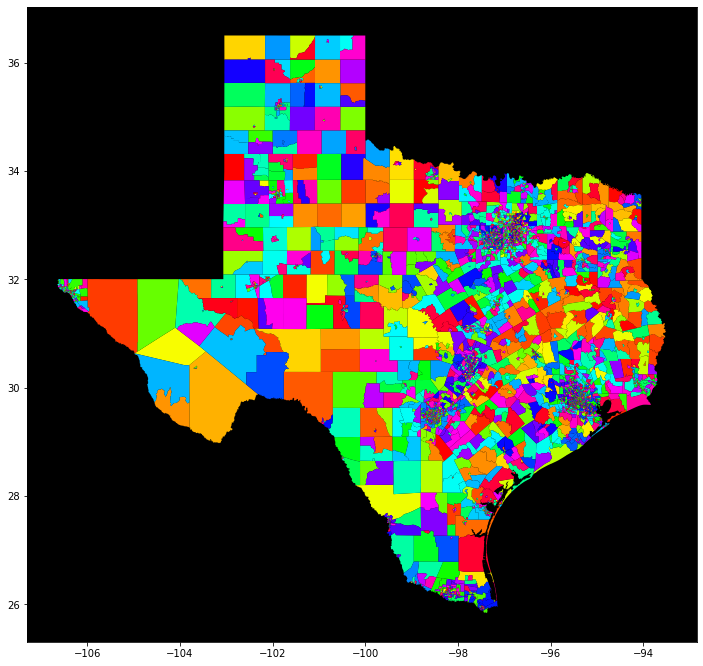

In [173]:
fig,ax = plt.subplots(figsize=(12,12))
census_shp.plot(ax=ax, zorder=2, legend=False, cmap='hsv')
ax.set(facecolor = "black")
ax.grid(False)

In [178]:
zips['GEOID10'] = zips['GEOID10'].astype(int)

In [179]:
zip_5 = zips[zips['GEOID10'].isin(city_zip['zip'])]

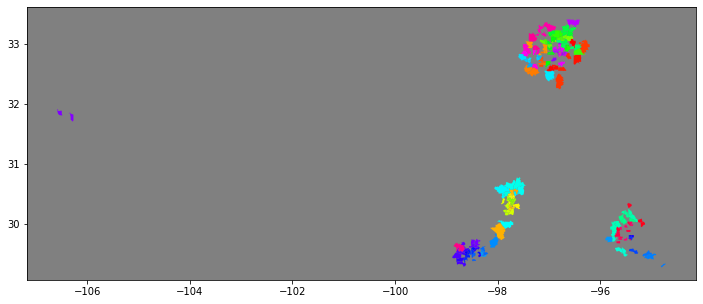

In [180]:
fig,ax = plt.subplots(figsize=(12,12))
zip_5.plot(ax=ax, zorder=2, legend=False, cmap='hsv')
ax.set(facecolor = "gray")
ax.grid(False)

In [182]:
zip_5.shape # we started with 215.  Which one is missing?

(214, 10)

In [183]:
zri_map = zri[['RegionName', '2021-07']]
zri_map.head()

,RegionName,2021-07
0,10025,2894.0
1,60657,1584.0
2,10023,2869.0
3,77494,1462.0
4,60614,1928.0


In [184]:
# merge zri data to out 5 city zip codes
zip_5 = zip_5.merge(zri_map, how='inner', left_on='GEOID10', right_on='RegionName').rename(columns={'2021-07':'zri'})

In [186]:
# create lists of each city's zip codes
houston_zip = list(city_zip[city_zip['metro']=='houston']['zip'])
dfw_zip = list(city_zip[city_zip['metro']=='dfw']['zip'])
austin_zip = list(city_zip[city_zip['metro']=='austin']['zip'])
san_antonio_zip = list(city_zip[city_zip['metro']=='san_antonio']['zip'])
el_paso_zip = list(city_zip[city_zip['metro']=='el_paso']['zip'])

In [187]:
# Divide our zip_5 into each individual city
map_zip_houston = zipz[zipz['GEOID10'].isin(houston_zip)]
map_zip_dfw = zipz[zipz['GEOID10'].isin(dfw_zip)]
map_zip_austin = zipz[zipz['GEOID10'].isin(austin_zip)]
map_zip_san_antonio = zipz[zipz['GEOID10'].isin(san_antonio_zip)]
map_zip_el_paso = zipz[zipz['GEOID10'].isin(el_paso_zip)]


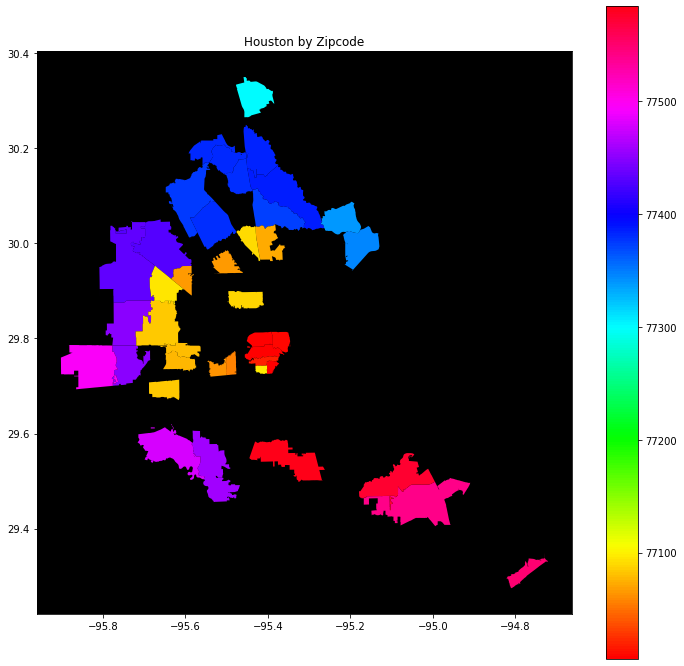

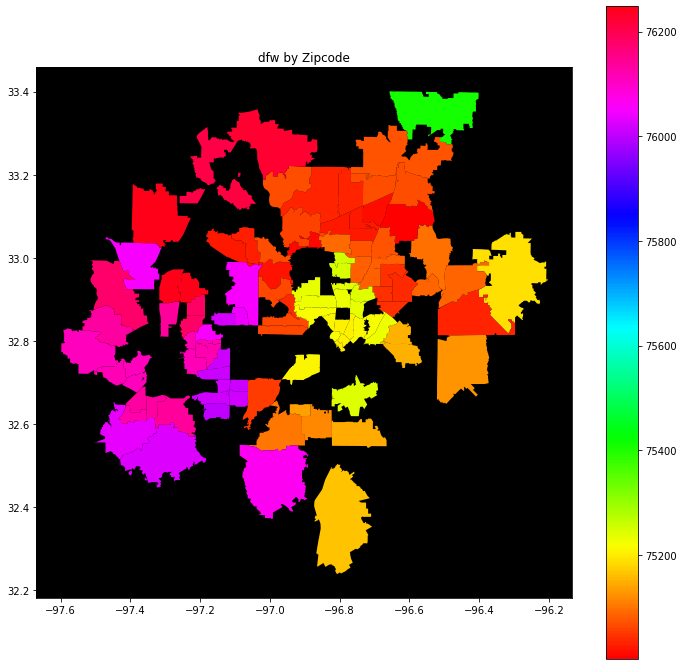

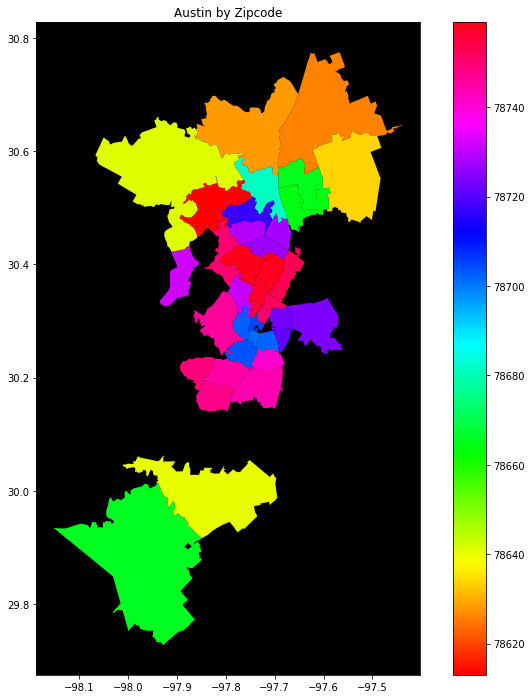

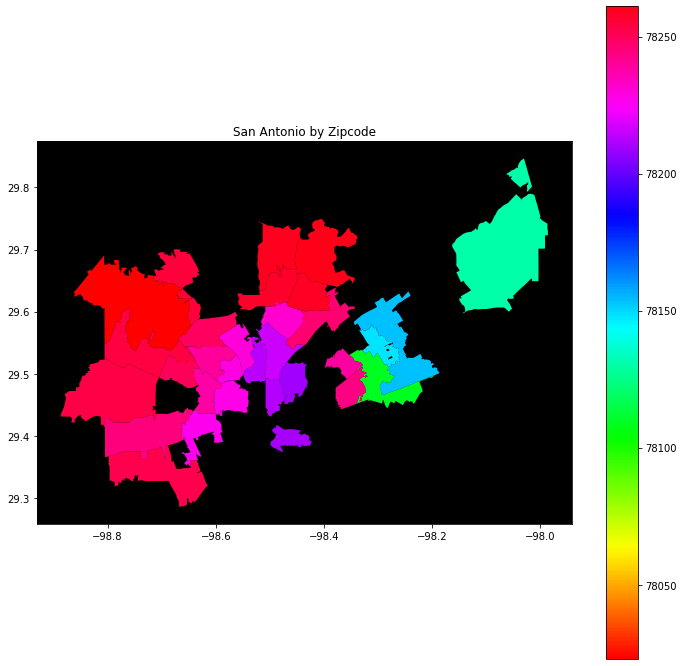

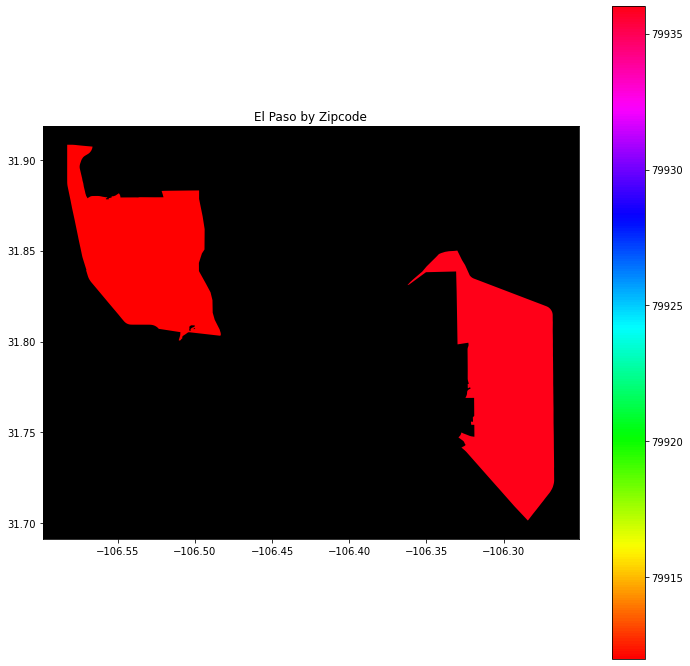

In [191]:
# coloring by zipcode alone

fig,ax = plt.subplots(figsize=(12,12))
map_zip_houston.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('Houston by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_dfw.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('dfw by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_austin.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('Austin by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_san_antonio.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('San Antonio by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_el_paso.plot(ax=ax, zorder=2, column='GEOID10', legend=True, cmap='hsv')
plt.title('El Paso by Zipcode')
ax.set(facecolor = "black")
ax.grid(False)

# There are several gaps.  This is due to zillow not reporting on all zip codes. 
# The empty zip codes will be filled later

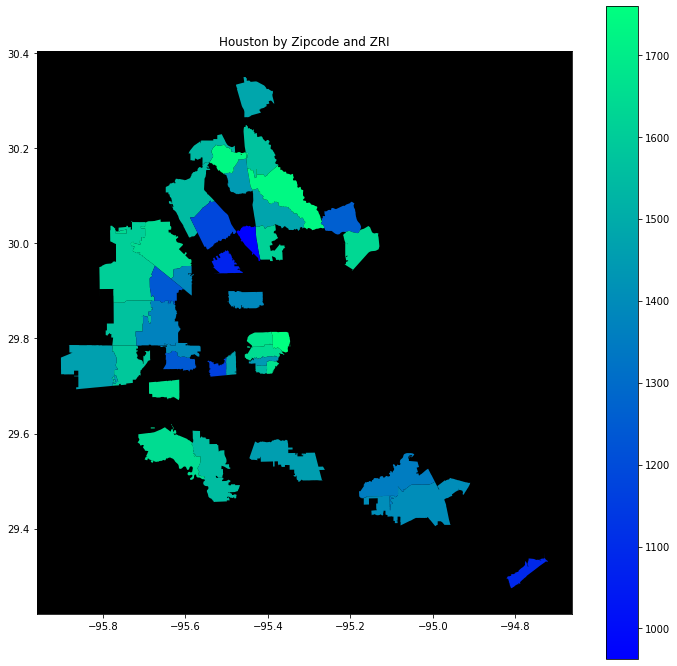

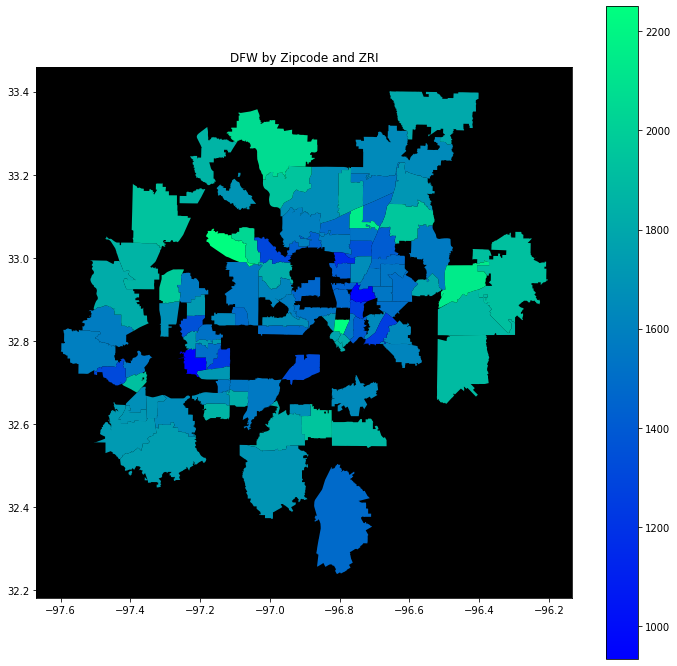

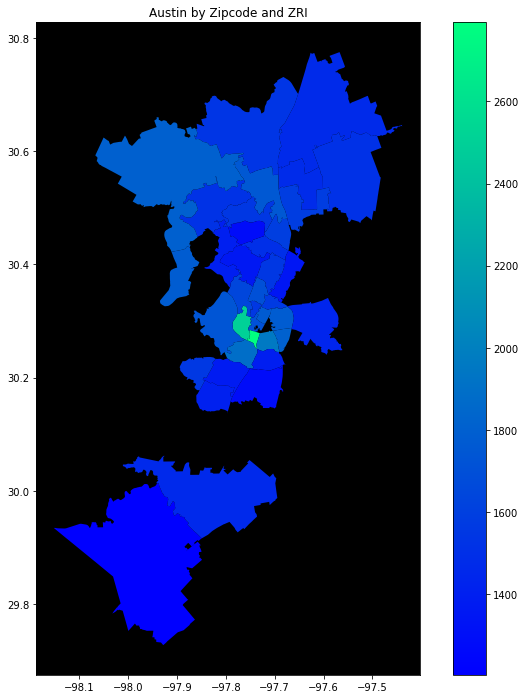

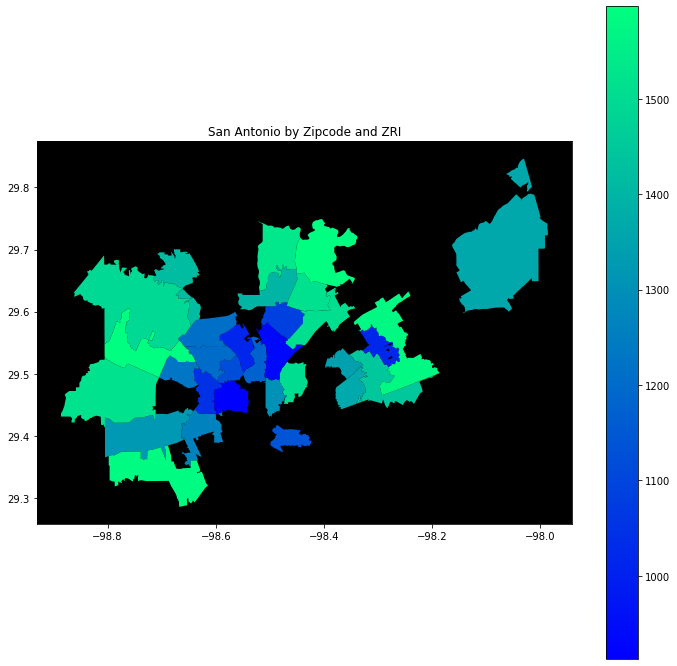

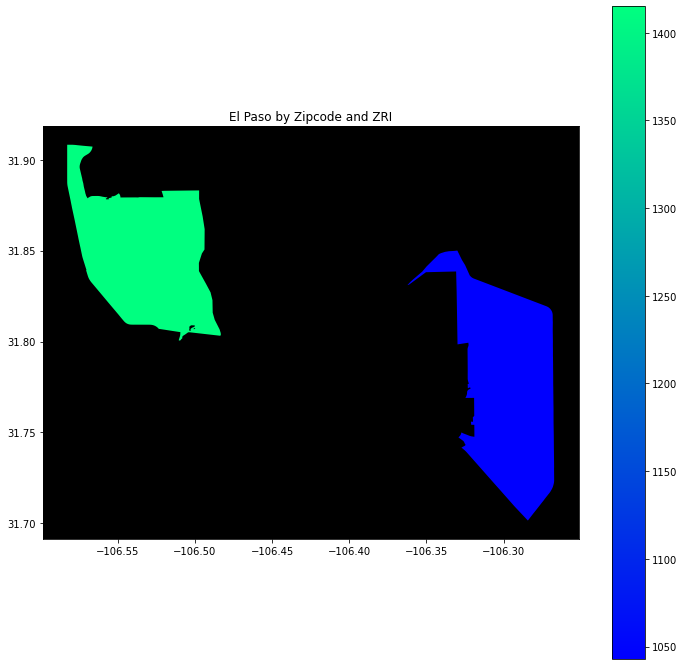

In [194]:
# coloring by zipcode and zri index

fig,ax = plt.subplots(figsize=(12,12))
map_zip_houston.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('Houston by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_dfw.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('DFW by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_san_antonio.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('San Antonio by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)

fig,ax = plt.subplots(figsize=(12,12))
map_zip_el_paso.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='winter')
plt.title('El Paso by Zipcode and ZRI')
ax.set(facecolor = "black")
ax.grid(False)


In [197]:
# create function for pulling roads from our large roadmap within a city's coordinates

def road_limit(df, xmin, xmax, ymin, ymax):
    df['x'] = df['geometry'].centroid.x
    df['y'] = df['geometry'].centroid.y
    df = df[df['x'] > xmin]
    df = df[df['x'] < xmax]
    df = df[df['y'] > ymin]
    df = df[df['y'] < ymax]
    return df

In [207]:
# Get roads from large roadmap, within each city coordinates (not the most computationally efficient)
austin_roads = road_limit(highway_sf, -98.2, -97.4, 29.7, 30.8)
dfw_roads = road_limit(highway_sf, -97.65, -96.2, 32.2, 33.45)
houston_roads = road_limit(highway_sf, -95.95, -94.9, 29.2, 30.4)
el_paso_roads = road_limit(highway_sf, -106.6, -106.25, 31.7, 31.92)
san_antonio_roads = road_limit(highway_sf, -98.95, -98, 29.25, 29.85)

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Geometry i

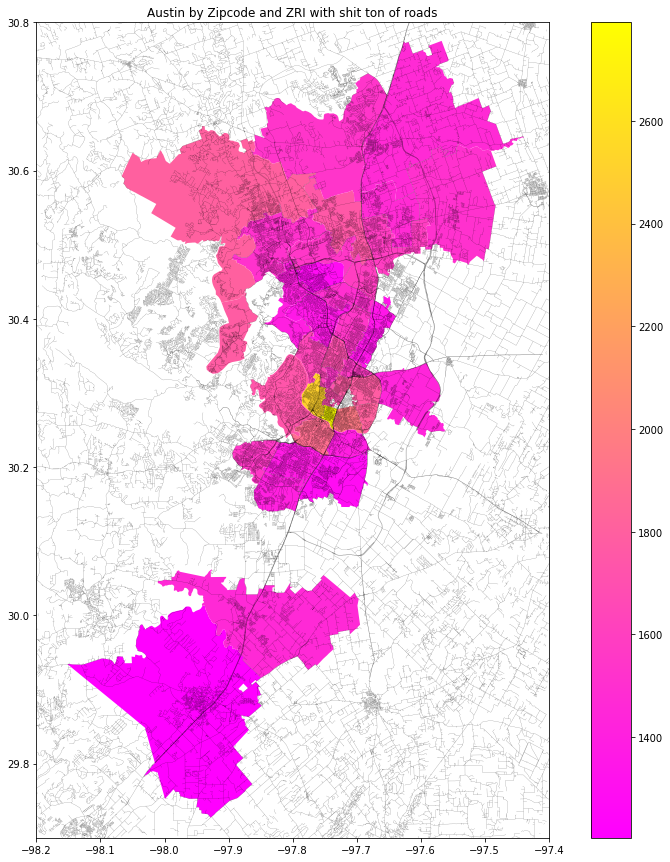

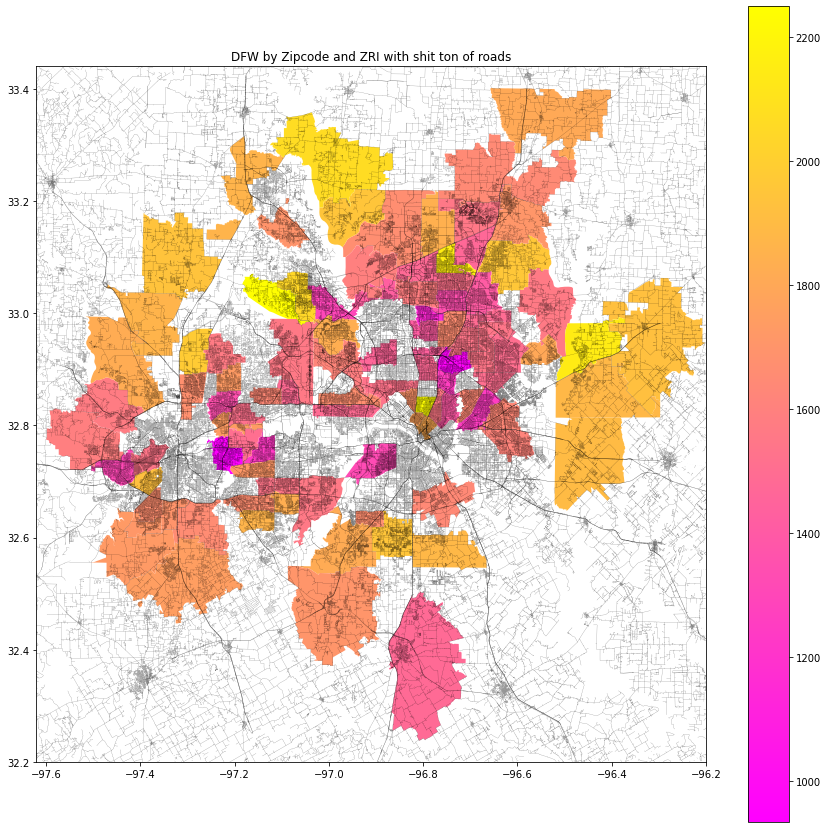

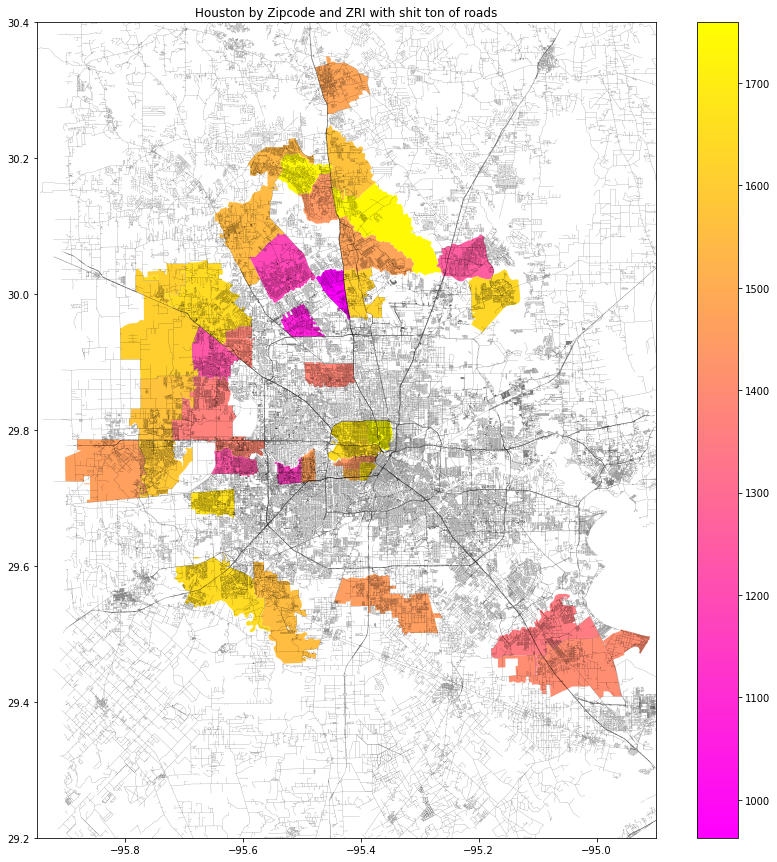

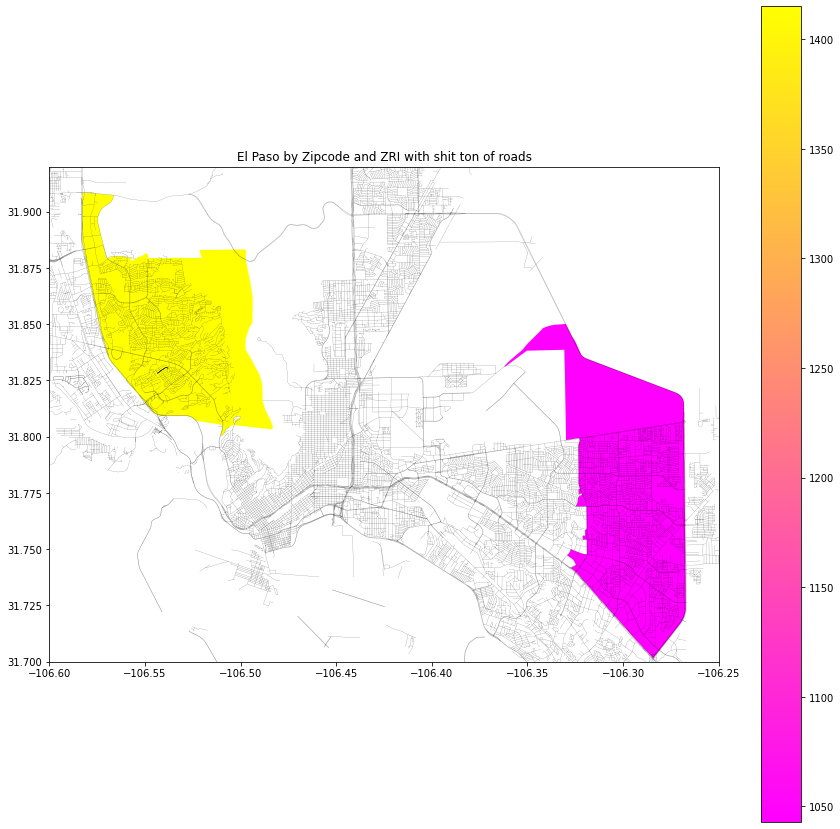

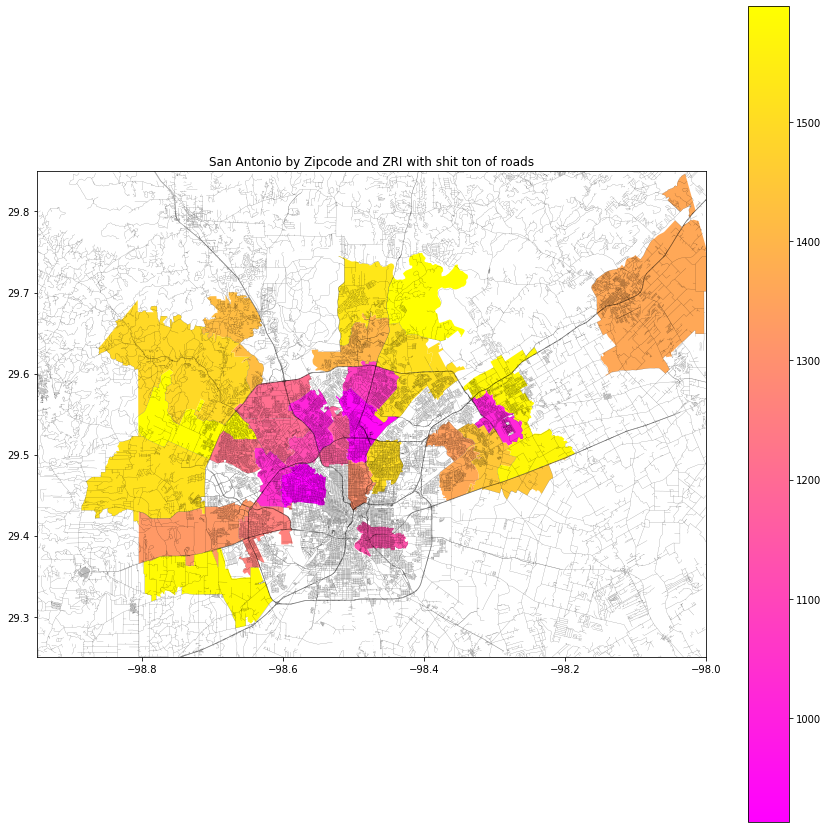

In [212]:
fig,ax = plt.subplots(figsize=(15,15))
map_zip_austin.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
austin_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('Austin by Zipcode and ZRI with shit ton of roads')
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_dfw.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
dfw_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('DFW by Zipcode and ZRI with shit ton of roads')
plt.ylim(32.2, 33.44)
plt.xlim(-97.62, -96.2)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_houston.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
houston_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('Houston by Zipcode and ZRI with shit ton of roads')
plt.ylim(29.2, 30.4)
plt.xlim(-95.95, -94.9)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_el_paso.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
el_paso_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('El Paso by Zipcode and ZRI with shit ton of roads')
plt.ylim(31.7, 31.92)
plt.xlim(-106.6, -106.25)
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15,15))
map_zip_san_antonio.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
san_antonio_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('San Antonio by Zipcode and ZRI with shit ton of roads')
plt.ylim(29.25, 29.85)
plt.xlim(-98.95, -98)
ax.set(facecolor = "white")
ax.grid(False)

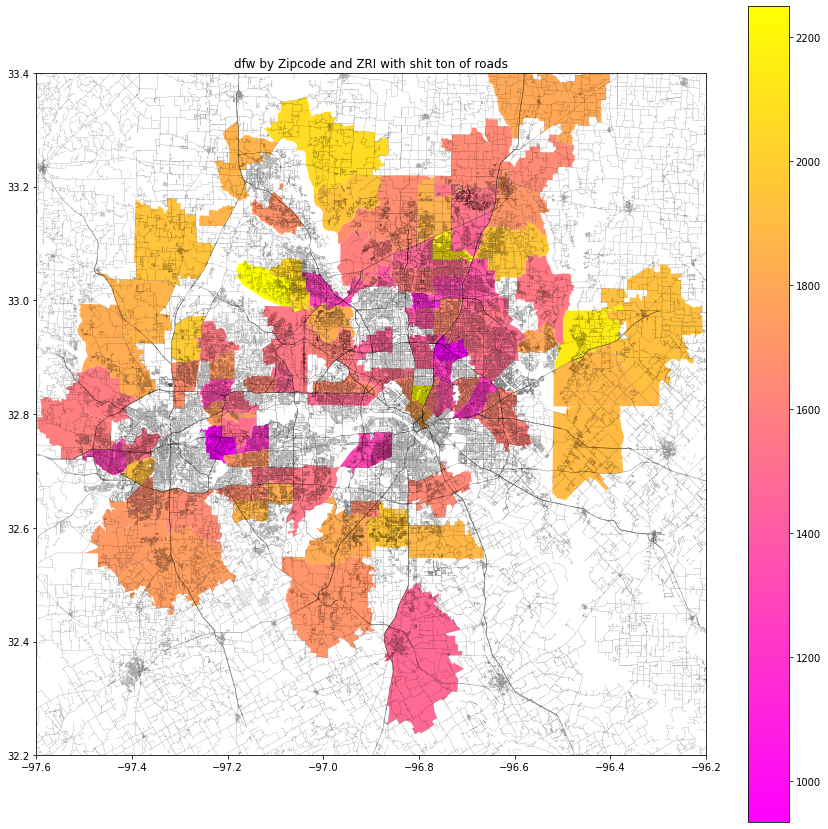

In [72]:
fig,ax = plt.subplots(figsize=(15,15))
map_zip_dfw.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
dfw_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2, alpha=0.6)
plt.title('dfw by Zipcode and ZRI with shit ton of roads')
plt.ylim(32.2, 33.4)
plt.xlim(-97.6, -96.2)
ax.set(facecolor = "white")
ax.grid(False)

In [215]:
dfw_roads.TYPE.unique()

array(['residential', 'trunk', 'secondary', 'service', 'motorway',
       'unclassified', 'primary', 'track', 'trunk_link', 'motorway_link',
       'tertiary', 'primary_link', 'secondary_link', 'construction',
       'Hike/Bike Path', 'path', 'footway', 'cycleway',
       '820 Entrance Ramp', 'pedestrian', 'ford; footway', 'mo',
       'residential; secondary', 'fac', 'unclassified; residential',
       'primary; residential', 'road'], dtype=object)

In [227]:
test = dfw_roads[~dfw_roads["TYPE"].isin(['residential'])]

<AxesSubplot:>

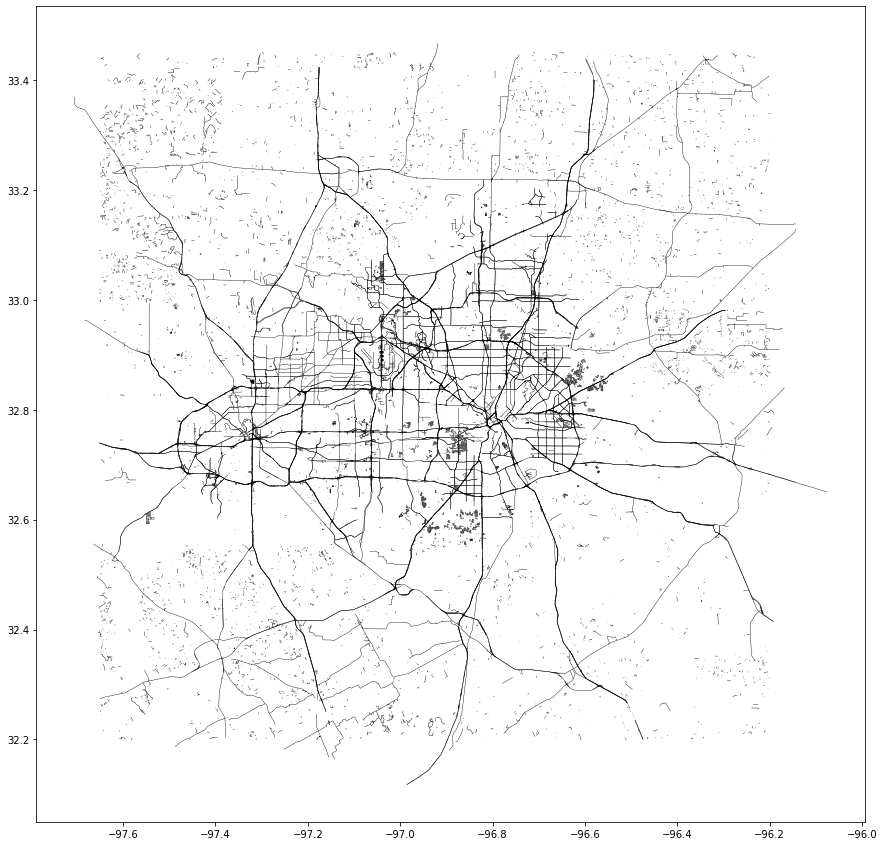

In [229]:
fig,ax = plt.subplots(figsize=(15,15))
test.plot(ax=ax, zorder=2, legend = True, color='black', linewidth=0.4, cmap='hsv')

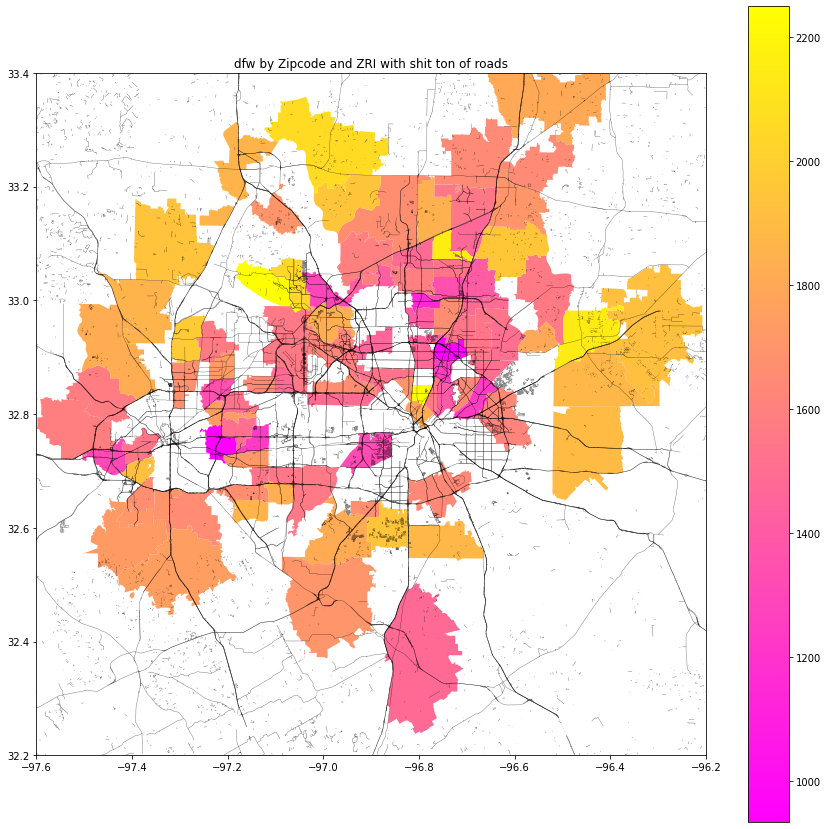

In [233]:
fig,ax = plt.subplots(figsize=(15,15))
map_zip_dfw.plot(ax=ax, zorder=1, column='zri', legend=True, cmap='spring')
test.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.4, alpha=0.6)
plt.title('dfw by Zipcode and ZRI with limited of roads')
plt.ylim(32.2, 33.4)
plt.xlim(-97.6, -96.2)
ax.set(facecolor = "white")
ax.grid(False)

[None]

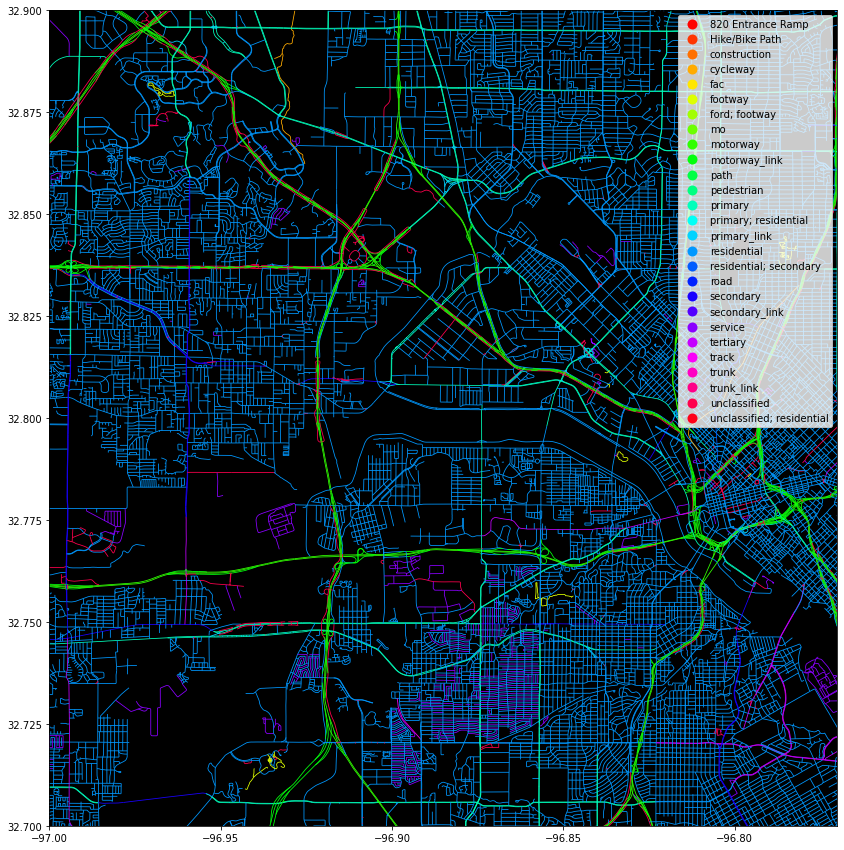

In [234]:
# experimenting with viewing by roadtypes.  I can limit the above roads to major roads (if it seems too crowded)
fig,ax = plt.subplots(figsize=(15,15))
dfw_roads.plot(ax=ax, zorder=2, legend = True, column='TYPE', linewidth=0.8, cmap='hsv')
plt.ylim(32.7, 32.9)
plt.xlim(-97.0, -96.77)
ax.set(facecolor = "black")


## fill in zips that aren't included in zillow df

In [235]:
dfw_zip = [75201, 75202, 75203, 75204, 75205, 75206, 75207, 75208, 75209, 75210, 75211, 75212, 75214, 75215, 75216, 75217, 75218, 75219, 75220, 75221, 75222, 75223, 75224, 75225, 75226, 75227, 75228, 75229, 75230, 75231, 75232, 75233, 75234, 75235, 75236, 75237, 75238, 75239, 75240, 75241, 75242, 75243, 75244, 75245, 75246, 75247, 75248, 75249, 75250, 75251, 75252, 75253, 75258, 75260, 75261, 75262, 75263, 75264, 75265, 75266, 75267, 75270, 75275, 75277, 75283, 75284, 75285, 75286, 75287, 75294, 75295, 75301, 75303, 75310, 75312, 75313, 75315, 75320, 75323, 75326, 75336, 75339, 75342, 75346, 75350, 75353, 75354, 75355, 75356, 75357, 75359, 75360, 75363, 75364, 75367, 75368, 75370, 75371, 75372, 75373, 75374, 75376, 75378, 75379, 75380, 75381, 75382, 75386, 75387, 75388, 75389, 75390, 75391, 75392, 75393, 75394, 75395, 75396, 75397, 75398]

sanan_zip = [78023, 78056, 78073, 78109, 78112, 78154, 78201, 78202, 78203, 78204, 78205, 78207, 78208, 78209, 78210, 78211, 78212, 78213, 78214, 78215, 78216, 78217, 78218, 78219, 78220, 78221, 78222, 78223, 78224, 78225, 78226, 78227, 78228, 78229, 78230, 78231, 78232, 78233, 78234, 78235, 78236, 78237, 78238, 78239, 78240, 78242, 78243, 78244, 78245, 78247, 78248, 78249, 78250, 78251, 78252, 78253, 78254, 78255, 78256, 78257, 78258, 78259, 78260, 78263, 78264, 78266]

houston_zip = [77002, 77003, 77004, 77005, 77006, 77007, 77008, 77009, 77010, 77011, 77012, 77013, 77014, 77015, 77016, 77017, 77018, 77019, 77020, 77021, 77022, 77023, 77024, 77025, 77026, 77027, 77028, 77029, 77030, 77031, 77032, 77033, 77034, 77035, 77036, 77037, 77038, 77039, 77040, 77041, 77042, 77043, 77044, 77045, 77046, 77047, 77048, 77049, 77050, 77051, 77053, 77054, 77055, 77056, 77057, 77058, 77059, 77060, 77061, 77062, 77063, 77064, 77065, 77066, 77067, 77068, 77069, 77070, 77071, 77072, 77073, 77074, 77075, 77076, 77077, 77078, 77079, 77080, 77081, 77082, 77083, 77084, 77085, 77086, 77087, 77088, 77089, 77090, 77091, 77092, 77093, 77094, 77095, 77096, 77098, 77099, 77201, 77336, 77338, 77339, 77345, 77346, 77357, 77365, 77373, 77375, 77377, 77379, 77386, 77388, 77396, 77401, 77406, 77407, 77429, 77433, 77447, 77449, 77450, 77477, 77478, 77484, 77489, 77493, 77494, 77498, 77503, 77504, 77506, 77520, 77530, 77532, 77536, 77546, 77547, 77571, 77587, 77598]

austin_zip = [78610, 78613, 78617, 78641, 78652, 78653, 78660, 78664, 78681, 78701, 78702, 78703, 78704, 78705, 78712, 78717, 78719, 78721, 78722, 78723, 78724, 78725, 78726, 78727, 78728, 78729, 78730, 78731, 78732, 78733, 78734, 78735, 78736, 78737, 78738, 78739, 78741, 78742, 78744, 78745, 78746, 78747, 78748, 78749, 78750, 78751, 78752, 78753, 78754, 78756, 78757, 78758, 78759]

elpaso_zip = [79821, 79835, 79901, 79902, 79903, 79904, 79905, 79906, 79907, 79908, 79911, 79912, 79915, 79920, 79922, 79924, 79925, 79927, 79928, 79930, 79932, 79934, 79935, 79936, 79938, 88063]

In [253]:
# full zip codes for each metro
houston_full_zips = zip_map[zip_map['GEOID10'].isin(houston_zip)]
dfw_full_zips = zip_map[zip_map['GEOID10'].isin(dfw_zip)]
sanan_full_zips = zip_map[zip_map['GEOID10'].isin(sanan_zip)]
austin_full_zips = zip_map[zip_map['GEOID10'].isin(austin_zip)]
elpaso_full_zips = zip_map[zip_map['GEOID10'].isin(elpaso_zip)]

In [261]:
# Create boundary geometry (maybe there's a simler way to do this?)
houston_boundary = houston_full_zips.copy()
dfw_boundary = dfw_full_zips.copy()
sanan_boundary = sanan_full_zips.copy()
austin_boundary = austin_full_zips.copy()
elpaso_boundary = elpaso_full_zips.copy()

houston_boundary['geometry'] = houston_full_zips['geometry'].boundary
dfw_boundary['geometry'] = dfw_full_zips['geometry'].boundary
sanan_boundary['geometry'] = sanan_full_zips['geometry'].boundary
austin_boundary['geometry'] = austin_full_zips['geometry'].boundary
elpaso_boundary['geometry'] = elpaso_full_zips['geometry'].boundary

In [262]:
# remove zip codes already included in zillow data
houston_half_zips = houston_full_zips[~houston_full_zips['GEOID10'].isin(map_zip_houston['GEOID10'])]
dfw_half_zips = dfw_full_zips[~dfw_full_zips['GEOID10'].isin(map_zip_dfw['GEOID10'])]
sanan_half_zips = sanan_full_zips[~sanan_full_zips['GEOID10'].isin(map_zip_san_antonio['GEOID10'])]
austin_half_zips = austin_full_zips[~austin_full_zips['GEOID10'].isin(map_zip_austin['GEOID10'])]
elpaso_half_zips = elpaso_full_zips[~elpaso_full_zips['GEOID10'].isin(map_zip_el_paso['GEOID10'])]

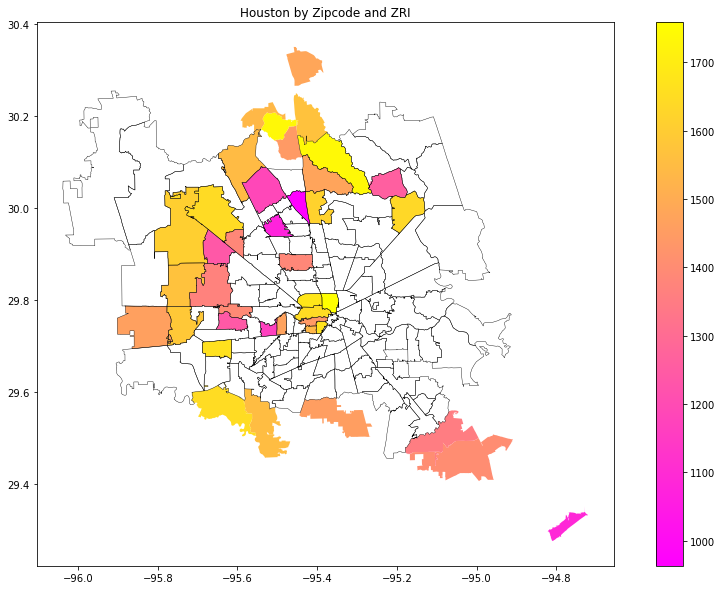

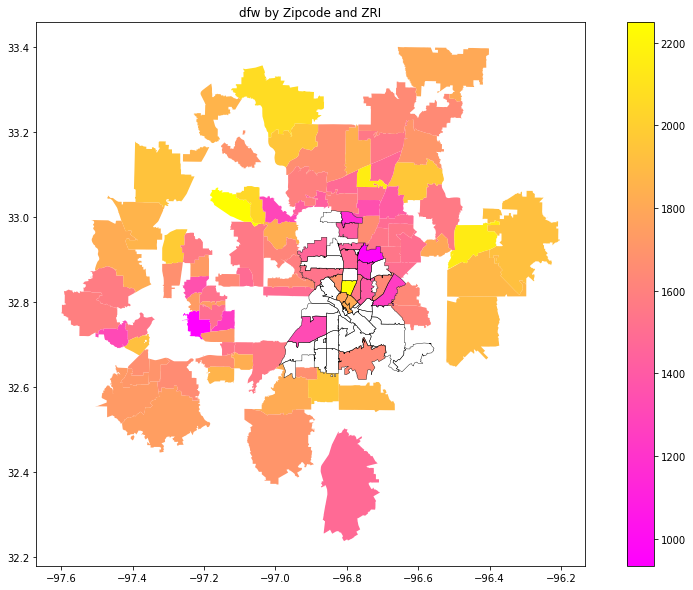

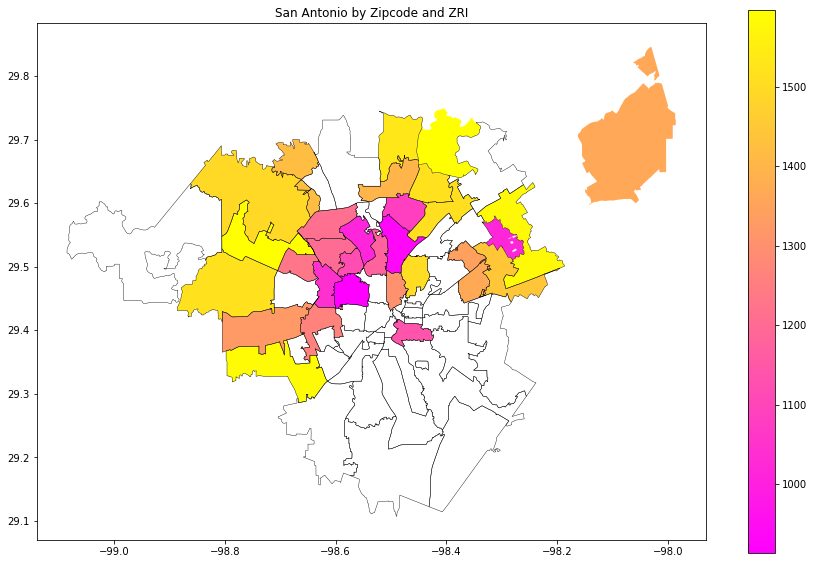

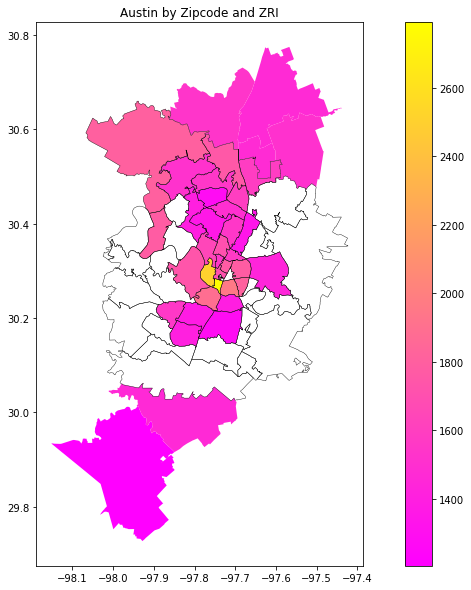

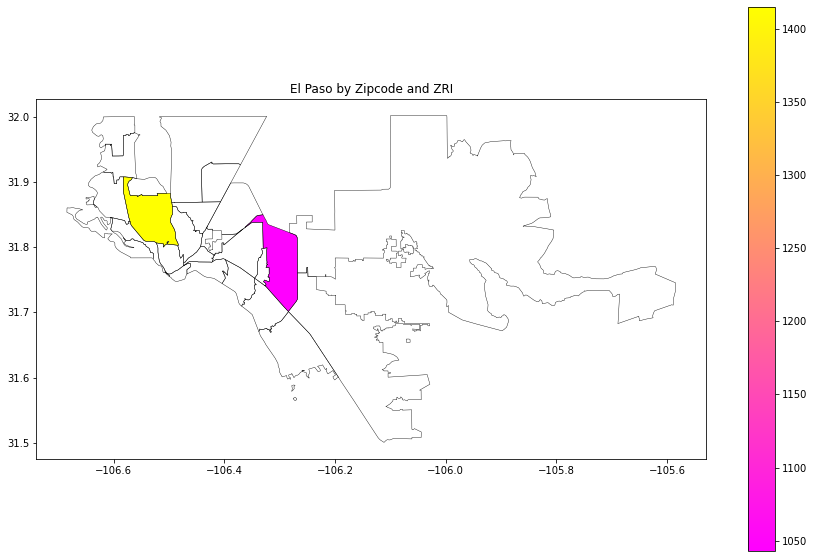

In [290]:
# filled in zip codes 
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_houston.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
houston_half_zips.plot(ax=ax, zorder=1, legend=True, color='white')
houston_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
plt.title('Houston by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_dfw.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
dfw_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
dfw_half_zips.plot(ax=ax, zorder=1, legend=True, color='white')
plt.title('dfw by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_san_antonio.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
sanan_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
sanan_half_zips.plot(ax=ax, zorder=1, legend=True, color='white')
plt.title('San Antonio by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
austin_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='white')
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

fig,ax = plt.subplots(figsize=(15, 10))
map_zip_el_paso.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
elpaso_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
elpaso_half_zips.plot(ax=ax, zorder=1, legend=True, color='white')
plt.title('El Paso by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)

# Not great results

(-98.2, -97.4)

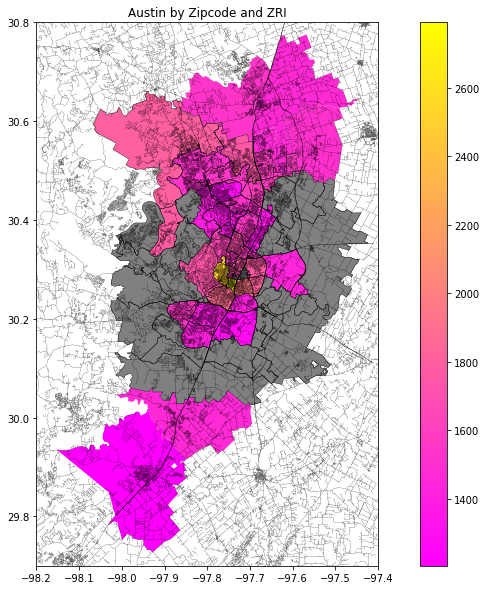

In [287]:
# all together, it could look something like this
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
austin_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
austin_roads.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.2)
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray')
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "white")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)

In [288]:
austin_roads_less = austin_roads[~austin_roads["TYPE"].isin(['residential'])]

(-98.2, -97.4)

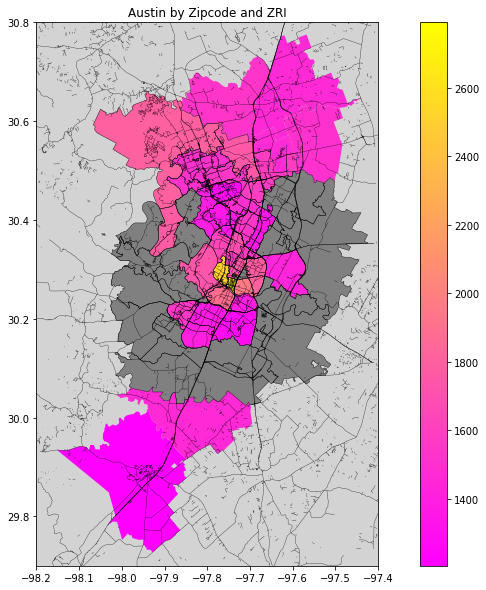

In [300]:
# or with reduced roads
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
austin_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
austin_roads_less.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3)
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray')
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "#D3D3D3")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)
# way too busy, no longer insightful.  Roads don't seem to add anything other than needless complexity

(-98.2, -97.4)

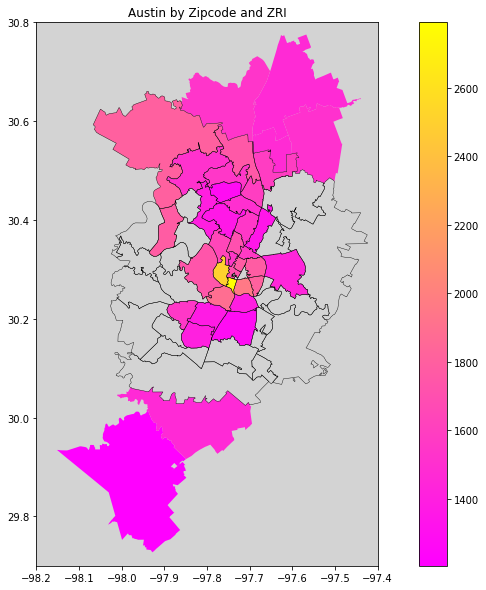

In [301]:
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring')
austin_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
#austin_roads_less.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3)
#austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray')
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "#D3D3D3")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)


In [302]:
apoints = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/points.shp')
abuildings = gpd.read_file('/Users/trevorban/Downloads/texas_shapefile/austin/shape/buildings.shp')

In [305]:
abuildings['type'].unique()

array(['cinema', 'government', 'university', None, 'museum', 'parking',
       'school', 'stadium seating', 'restaurant', 'retail', 'commercial',
       'fast_food', 'bank', 'roof', 'fuel', 'place_of_worship', 'hotel',
       'post_office', 'police', 'clinic', 'car_wash', 'house', 'church',
       'library', 'fire_station', 'townhall', 'pharmacy', 'barn',
       'office', 'garage', 'community_centre', 'college', 'arts_centre',
       'shop', 'information', 'toilets', 'cafe', 'stadium',
       'events_venue', 'industrial', 'car_rental', 'kindergarten',
       'storage_tank', 'motel', 'apartments', 'stable', 'covered area',
       'public', 'undefined', 'warehouse', 'cafeteria', 'shelter',
       'doctors', 'school;public_bu', 'veterinary', 'public_building',
       'pub', 'bar', 'dormitory', 'hospital', 'construction', 'childcare',
       'service', 'detached', 'greenhouse', 'vehicle_inspecti',
       'bus_station', 'Bing', 'train_station', 'residential',
       'demountable', 'silo', '

In [340]:
# plot some cafes for the hell of it
cafe = abuildings[abuildings['type']=='cafe']

In [341]:
cafe['geometry'] = cafe['geometry'].centroid

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.
/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


(-98.2, -97.4)

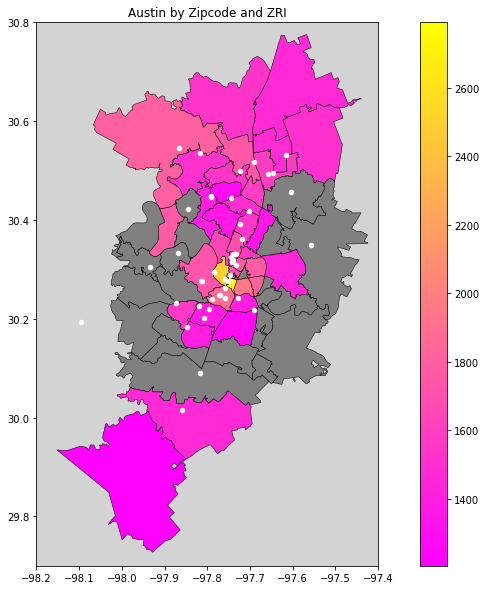

In [343]:
fig,ax = plt.subplots(figsize=(15, 10))
map_zip_austin.plot(ax=ax, zorder=2, column='zri', legend=True, cmap='spring', edgecolor='black', linewidth=0.5)
# austin_boundary.plot(ax=ax, zorder=3, color='black', linewidth=0.4)
# austin_roads_less.plot(ax=ax, zorder=2, legend=True, color='black', linewidth=0.3)
cafe.plot(ax=ax, zorder=4, markersize=20, color='white')
austin_half_zips.plot(ax=ax, zorder=1, legend=True, color='gray', edgecolor='black', linewidth=0.5)
plt.title('Austin by Zipcode and ZRI')
ax.set(facecolor = "#D3D3D3")
ax.grid(False)
plt.ylim(29.7, 30.8)
plt.xlim(-98.2, -97.4)


# EDGECOLOR!! no need for computing boundaries, duh

In [335]:
cinema

,osm_id,name,type,geometry
144,29169984,Cedar Park Police Department,police,POINT (-97.82459 30.52023)
7153,236594057,Texas Department of Poblic Safety,police,POINT (-97.73972 30.27726)
10432,328649852,APD Headquarters,police,POINT (-97.73503 30.26744)
27997,379206169,Austin Police Department,police,POINT (-97.70026 30.25925)
242956,382383215,Rollingwood Police Department,police,POINT (-97.78859 30.27564)
303517,382783256,Austin Police Association,police,POINT (-97.67541 30.27291)
421778,383192668,Austin Police Department: Jaime Padron Substatio,police,POINT (-97.69617 30.41431)
431688,383350363,Westlake Hills Police Department,police,POINT (-97.79990 30.29109)
572860,495760406,Round Rock Police Department,police,POINT (-97.68706 30.54039)
573538,545135809,Elgin Police Department,police,POINT (-97.37163 30.34747)
